In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [8]:
data = pd.read_csv(r'Herbals and preperations.csv', encoding='latin-1')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [9]:
data = data.apply(lambda x: x.str.lower() if x.dtype == "object" else x)
data=data.dropna(subset=['bot_name'])
data['bot_name'] = data['bot_name'].str.strip()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [10]:
data = data.join(pd.get_dummies(data['author'].str.lower().str.strip(), prefix='Author'))
data['author'] = data['author'].dropna(axis=0).str.strip()
data = data.apply(lambda x: x.str.lower() if x.dtype == "object" else x)
data=data.dropna(subset=['bot_name'])
data['bot_name'] = data['bot_name'].str.strip()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [15]:
def apply_apriori(df):

  # Convert the data into a one-hot encoded format
  oht = df.groupby(['drug', 'bot_name']).size().unstack().fillna(0)

  # Convert integer values to boolean
  oht = oht.applymap(lambda x: 1 if x > 0 else 0)

  # Find frequent itemsets using the Apriori algorithm
  frequent_itemsets = apriori(oht, min_support=0.1, use_colnames=True)
  return frequent_itemsets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [12]:
def max_itemsets(frequent_itemsets, count = 3, measure='support'):

  itemsets_drugs = frequent_itemsets[frequent_itemsets['itemsets'].apply(lambda x: len(x) == count)]
  itemsets_drugs = itemsets_drugs.sort_values(by='support', ascending=False)
  return itemsets_drugs

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
def get_association(frequent_itemsets):
  association_rules_df = association_rules(frequent_itemsets, metric='lift', min_threshold=5.0)
  return association_rules_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [14]:
def get_association_filter(frequent_itemsets):
    association_rules_df = association_rules(frequent_itemsets, metric='lift', min_threshold=5.0)
    filtered_rules = association_rules_df[
        (association_rules_df['antecedents'].apply(len) == 2) &
        (association_rules_df['consequents'].apply(len) == 1)
    ]
    return filtered_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [16]:
data.head(10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,drug,author,herb_part,bot_name,disease_category,taste,potency,ultimate_taste,inherent_action,Author_agathiyar,Author_therayar
0,parangipattai choornam,agathiyar,NaN,smilax china,diabetes,sweet,cold,sweet,"udarthetri,megapinivilaki,kamamperuki,thuyimai...",1,0
1,parangipattai choornam,agathiyar,stem juice,saccharum officinarum,diabetes,sweet,cold,sweet,"ulalalatri,alugalatri,kulirchiyundaki,sirukali...",1,0
2,aavarai kiyalam,agathiyar,leaf,cassia auriculata,diabetes,astringent,cold,sweet,"thuvarpi,uramaki",1,0
3,aavarai kiyalam,agathiyar,NaN,kalamadham,diabetes,NaN,NaN,NaN,NaN,1,0
4,aavarai kiyalam,agathiyar,stem bark,cassis fistula,diabetes,"astringent , mildbitter",hot,spicy,NaN,1,0
5,aavarai kiyalam,agathiyar,seed,piper nigrum,diabetes,"bitter, pungent",hot,spicy,"karalundaki,agatuvaiagatri,muraiveppagatri,tha...",1,0
6,sukku kudineer,agathiyar,jaggery,borassus flabellifer,diabetes,"astringent, sweet",cold,sweet,"thuvarpi,aanmaiperuki",1,0
7,sukku kudineer,agathiyar,dried rhizome,zingiber officinale,diabetes,pungent,hot,spicy,"agatuvaiyagatri,pasitheethuntri,umilneerperuki...",1,0
8,sukku kudineer,agathiyar,root,gmelina asiatica,diabetes,"mildbitter, astringent",cold,sweet,"udarthetri,ullalaratri,manamutti",1,0
9,sirukurinjan kiyalam,agathiyar,root,gymnema sylvestre,diabetes,bitter,hot,spicy,"thuvarpi,pasitheethundi,uramaki,kulirchiyundaki",1,0


In [17]:
data.loc[data.bot_name.isin(['terminalia chebula', 'terminalia bellarica', 'phyllanthus emblica']), 'bot_name'] = 'triphala'
data.loc[data.bot_name.isin(['piper nigrum', 'piper longum', 'zingiber officinale']), 'bot_name'] = 'trikatu'
data.loc[(data.disease_category == 'diabetes') & (data.bot_name == 'saccharum officinarum'), 'bot_name'] = 'tinospora cordifolia'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [18]:
data_dia = data.loc[data['disease_category'].apply(lambda x: x in ['diab/ tb ', 'diabetes'])].copy()
data_tub =  data.loc[data['disease_category'].apply(lambda x: x in ['diab/ tb ', 'tuberculosis '])].copy()
data_dia_aga = data_dia.loc[data_dia['author'].apply(lambda x: x in ['agathiyar'])]
data_dia_the = data_dia.loc[data_dia['author'].apply(lambda x: x in ['therayar'])]
data_tub_aga = data_tub.loc[data_tub['author'].apply(lambda x: x in ['agathiyar'])]
data_tub_the = data_tub.loc[data_tub['author'].apply(lambda x: x in ['therayar'])]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Diabetic data of agathiyar

In [19]:
frequent_itemset = apply_apriori(data_dia_aga)
len(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


17

In [20]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
16,0.117647,"(tinospora cordifolia, elettaria cardamomum, s..."


,support,itemsets


,support,itemsets


In [21]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2,"(elettaria cardamomum, tinospora cordifolia)",(syzygium aromaticum),0.117647,0.147059,0.117647,1.0,6.8,0.100346,inf,0.966667
3,"(tinospora cordifolia, syzygium aromaticum)",(elettaria cardamomum),0.117647,0.147059,0.117647,1.0,6.8,0.100346,inf,0.966667


In [22]:
data_name = "Diabetic-data-agathiyar"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Diabetic data of therayar

In [23]:
frequent_itemset = apply_apriori(data_dia_the)
len(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


44

In [24]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
42,0.20,"(terminalia bellirica, triphala, trikatu)"
36,0.12,"(cyperus rotundus, triphala, costus speciosus)"
37,0.12,"(costus speciosus, plectranthus vettiveroides,..."
38,0.12,"(costus speciosus, terminalia bellirica, trikatu)"
39,0.12,"(costus speciosus, terminalia bellirica, triph..."
40,0.12,"(costus speciosus, triphala, trikatu)"
41,0.12,"(glycyrrhiza glabra, trikatu, myristica fragrans)"


,support,itemsets
43,0.12,"(costus speciosus, terminalia bellirica, triph..."


,support,itemsets


In [25]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2,"(costus speciosus, trikatu)",(plectranthus vettiveroides),0.20,0.12,0.12,0.60,5.00,0.0960,2.20,1.000000
4,"(glycyrrhiza glabra, trikatu)",(myristica fragrans),0.16,0.12,0.12,0.75,6.25,0.1008,3.52,1.000000
5,"(trikatu, myristica fragrans)",(glycyrrhiza glabra),0.12,0.16,0.12,1.00,6.25,0.1008,inf,0.954545


In [26]:
data_name = "Diabetic-data-therayar"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Tuberculosis data of agathiyar

In [27]:
frequent_itemset = apply_apriori(data_tub_aga)
len(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


61

In [28]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
53,0.238095,"(terminalia bellirica, triphala, trikatu)"
45,0.190476,"(triphala, alpinia galanga, trikatu)"
46,0.190476,"(carum copticum, triphala, trikatu)"
38,0.142857,"(saccharum officinarum, alpinia galanga, trikatu)"
39,0.142857,"(saccharum officinarum, triphala, alpinia gala..."
40,0.142857,"(solanum surattense, solanum trilobatum, alpin..."
41,0.142857,"(solanum surattense, alpinia galanga, trikatu)"
42,0.142857,"(solanum surattense, triphala, alpinia galanga)"
43,0.142857,"(solanum trilobatum, alpinia galanga, trikatu)"
44,0.142857,"(solanum trilobatum, triphala, alpinia galanga)"


,support,itemsets
54,0.142857,"(saccharum officinarum, triphala, alpinia gala..."
55,0.142857,"(solanum surattense, solanum trilobatum, alpin..."
56,0.142857,"(solanum surattense, solanum trilobatum, triph..."
57,0.142857,"(solanum surattense, triphala, alpinia galanga..."
58,0.142857,"(solanum trilobatum, triphala, alpinia galanga..."
59,0.142857,"(solanum surattense, solanum trilobatum, triph..."


,support,itemsets
60,0.142857,"(trikatu, solanum trilobatum, triphala, solanu..."


In [29]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
6,"(saccharum officinarum, trikatu)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
8,"(saccharum officinarum, triphala)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
10,"(solanum surattense, solanum trilobatum)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
11,"(solanum surattense, alpinia galanga)",(solanum trilobatum),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
12,"(solanum trilobatum, alpinia galanga)",(solanum surattense),0.142857,0.142857,0.142857,1.00,7.00,0.122449,inf,1.000000
16,"(solanum surattense, trikatu)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
17,"(alpinia galanga, trikatu)",(solanum surattense),0.190476,0.142857,0.142857,0.75,5.25,0.115646,3.428571,1.000000
20,"(solanum surattense, triphala)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444
21,"(triphala, alpinia galanga)",(solanum surattense),0.190476,0.142857,0.142857,0.75,5.25,0.115646,3.428571,1.000000
24,"(solanum trilobatum, trikatu)",(alpinia galanga),0.142857,0.190476,0.142857,1.00,5.25,0.115646,inf,0.944444


In [30]:
data_name = "Tuberculosis-data-agathiyar"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Tuberculosis data of therayar

In [31]:
frequent_itemset = apply_apriori(data_tub_the)
frequent_itemset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.307692,(abies spectabilis)
1,0.153846,(acalypha indica)
2,0.153846,(carum copticum)
3,0.384615,(costus speciosus)
4,0.230769,(cuminum cyminum)
...,...,...
1107,0.153846,"(nei, myristica fragrans, honey, syzygium arom..."
1108,0.153846,"(nei, myristica fragrans, syzygium aromaticum,..."
1109,0.153846,"(nei, myristica fragrans, honey, syzygium arom..."
1110,0.153846,"(nei, myristica fragrans, honey, syzygium arom..."


In [32]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
103,0.230769,"(abies spectabilis, saccharum officinarum, cum..."
92,0.153846,"(abies spectabilis, costus speciosus, cuminum ..."
193,0.153846,"(honey, syzygium aromaticum, myristica fragrans)"
187,0.153846,"(honey, saccharum officinarum, milk)"
188,0.153846,"(honey, syzygium aromaticum, milk)"
...,...,...
142,0.153846,"(costus speciosus, saccharum officinarum, cumi..."
143,0.153846,"(costus speciosus, mesua nagassarium, glycyrrh..."
144,0.153846,"(costus speciosus, glycyrrhiza glabra, myristi..."
145,0.153846,"(costus speciosus, glycyrrhiza glabra, nigella..."


,support,itemsets
240,0.153846,"(abies spectabilis, cuminum cyminum, costus sp..."
410,0.153846,"(honey, saccharum officinarum, milk, trikatu)"
384,0.153846,"(saccharum officinarum, syzygium aromaticum, c..."
385,0.153846,"(saccharum officinarum, cuminum cyminum, trika..."
386,0.153846,"(syzygium aromaticum, cuminum cyminum, trikatu..."
...,...,...
319,0.153846,"(abies spectabilis, syzygium aromaticum, plect..."
320,0.153846,"(abies spectabilis, plectranthus vettiveroides..."
321,0.153846,"(abies spectabilis, saccharum officinarum, syz..."
322,0.153846,"(abies spectabilis, saccharum officinarum, tri..."


,support,itemsets
467,0.153846,"(costus speciosus, glycyrrhiza glabra, cuminum..."
660,0.153846,"(myristica fragrans, syzygium aromaticum, cumi..."
630,0.153846,"(honey, syzygium aromaticum, cuminum cyminum, ..."
631,0.153846,"(honey, cuminum cyminum, plectranthus vettiver..."
632,0.153846,"(honey, syzygium aromaticum, cuminum cyminum, ..."
...,...,...
558,0.153846,"(nei, honey, syzygium aromaticum, trikatu, abi..."
559,0.153846,"(honey, syzygium aromaticum, plectranthus vett..."
560,0.153846,"(honey, plectranthus vettiveroides, trikatu, a..."
561,0.153846,"(honey, syzygium aromaticum, plectranthus vett..."


In [33]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
4,"(abies spectabilis, costus speciosus)",(nigella sativa),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
6,"(abies spectabilis, glycyrrhiza glabra)",(nigella sativa),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
8,"(abies spectabilis, myristica fragrans)",(milk),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
10,"(abies spectabilis, milk)",(nei),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
11,"(abies spectabilis, nei)",(milk),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
...,...,...,...,...,...,...,...,...,...,...
134,"(saccharum officinarum, plectranthus vettivero...",(nei),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
136,"(syzygium aromaticum, plectranthus vettiveroides)",(nei),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
138,"(saccharum officinarum, syzygium aromaticum)",(nei),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0
140,"(saccharum officinarum, trikatu)",(nei),0.153846,0.153846,0.153846,1.0,6.5,0.130178,inf,1.0


In [34]:
data_name = "Tuberculosis-data-therayar"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Diabetes overall

In [35]:
frequent_itemset = apply_apriori(data_dia)
frequent_itemset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.103448,(cassia auriculata)
1,0.310345,(trikatu)
2,0.120690,(cuminum cyminum)
3,0.155172,(costus speciosus)
4,0.137931,(glycyrrhiza glabra)
5,0.103448,(milk)
6,0.120690,(myristica fragrans)
7,0.137931,(syzygium aromaticum)
8,0.120690,(hemidesmus indicus)
9,0.103448,(aloe barbadensis)


In [36]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
23,0.12069,"(terminalia bellirica, triphala, trikatu)"


,support,itemsets


,support,itemsets


In [37]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2,"(triphala, trikatu)",(terminalia bellirica),0.137931,0.155172,0.12069,0.875,5.638889,0.099287,6.758621,0.954286


In [38]:
data_name = "Diabetic-overall"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Tuberculosis overall

In [39]:
frequent_itemset = apply_apriori(data_dia)
frequent_itemset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.103448,(cassia auriculata)
1,0.310345,(trikatu)
2,0.120690,(cuminum cyminum)
3,0.155172,(costus speciosus)
4,0.137931,(glycyrrhiza glabra)
5,0.103448,(milk)
6,0.120690,(myristica fragrans)
7,0.137931,(syzygium aromaticum)
8,0.120690,(hemidesmus indicus)
9,0.103448,(aloe barbadensis)


In [40]:
display(max_itemsets(frequent_itemset, 3, 'support'))
display(max_itemsets(frequent_itemset, 4, 'support'))
display(max_itemsets(frequent_itemset, 5, 'support'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
23,0.12069,"(terminalia bellirica, triphala, trikatu)"


,support,itemsets


,support,itemsets


In [41]:
get_association_filter(frequent_itemset)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2,"(triphala, trikatu)",(terminalia bellirica),0.137931,0.155172,0.12069,0.875,5.638889,0.099287,6.758621,0.954286


In [42]:
data_name = "Tuberculosis-overall"
frequent_itemset.to_csv(f"frequent-itemsets-{data_name}.csv")
max_itemsets(frequent_itemset, 3, 'support').to_csv(f"group-count-3-{data_name}.csv")
max_itemsets(frequent_itemset, 4, 'support').to_csv(f"group-count-4-{data_name}.csv")
max_itemsets(frequent_itemset, 5, 'support').to_csv(f"group-count-5-{data_name}.csv")
get_association_filter(frequent_itemset).to_csv(f"association-{data_name}.csv")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Graph

In [43]:
def plot_itemset_frequency(df, data_name=""):
    frequent_itemsets = apply_apriori(df).sort_values(by = ['support'], ascending=False).head(30)
    plt.figure(figsize=(12, 6))
    plt.bar(frequent_itemsets['itemsets'].apply(lambda x: ', '.join(x)).astype(str), frequent_itemsets['support'], color='skyblue')
    plt.xticks(rotation=90)
    plt.xlabel('Itemsets')
    plt.ylabel('Support')
    plt.title(f'{data_name}: Frequent Itemsets and Their Support (top 30 by support)')
    plt.savefig(f'{data_name}: Frequent Itemsets and Their Support (top 30 by support).png', bbox_inches='tight')


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [44]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_word_cloud(df, data_name=''):
    data = apply_apriori(df)
    # Concatenate itemsets based on support
    itemsets = []
    for index, row in data.iterrows():
        itemset = ', '.join([str(item) for item in list(row['itemsets'])])
        for _ in range(int(row['support'] * 100)):  # Multiply by 100 for more prominent words
            itemsets.append(itemset)

    itemsets_text = ' '.join(itemsets)

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(itemsets_text)

    plt.figure(dpi=600)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{data_name}: Word Cloud of Itemsets.png')
    plt.savefig(f'{data_name}: Word Cloud of Itemsets.png')

# Usage
# Pass your DataFrame with itemsets and support


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [45]:
def plot_hexbin_support_confidence(df, data_name=""):
    frequent_itemsets = apply_apriori(df)
    association_rules_df = get_association_filter(frequent_itemsets)
    plt.figure(figsize=(10, 6))
    plt.hexbin(association_rules_df['support'], association_rules_df['confidence'], gridsize=20, cmap='YlGnBu', bins='log')
    plt.colorbar()
    plt.xlabel('Support')
    plt.ylabel('Confidence')
    plt.title(f'{data_name}: Hexbin Plot of Association Rules')
    plt.savefig(f'{data_name}: Hexbin Plot of Association Rules')
# plot_hexbin_support_confidence(data_tub)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [46]:
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_scatter(df, data_name=""):
    frequent_itemsets = apply_apriori(df)
    association_rules_df = get_association_filter(frequent_itemsets)
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(association_rules_df['support'], association_rules_df['confidence'], association_rules_df['lift'], c=association_rules_df['lift'], cmap='viridis')
    ax.set_xlabel('Support')
    ax.set_ylabel('Confidence')
    ax.set_zlabel('Lift')
    ax.set_title(f'{data_name}: 3D Scatter Plot of Support, Confidence, and Lift')
    plt.savefig(f'{data_name}:  3D Scatter Plot of Support, Confidence, and Lift')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [47]:
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_network_graph(df, data_name=''):
    frequent_itemsets = apply_apriori(df)
    association_rules_df = get_association_filter(frequent_itemsets).sort_values(by = ['support'], ascending=False).head(30)
    G = nx.Graph()

    for index, row in association_rules_df.iterrows():
        antecedents = ', '.join(list(row['antecedents']))
        consequents = ', '.join(list(row['consequents']))
        lift = row['lift']

        G.add_node(antecedents)
        G.add_node(consequents)
        G.add_edge(antecedents, consequents, weight=lift)

    edge_weights = [d['weight'] for (u, v, d) in G.edges(data=True)]
    edge_colors = [d['weight'] for (u, v, d) in G.edges(data=True)]

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    pos = nx.spring_layout(G, dim=3)

    nodes = G.nodes()

    for node in nodes:
        (x, y, z) = pos[node]
        ax.text(x, y, z, s=node, fontsize=8)

    for (u, v, d) in G.edges(data=True):
        x, y, z = pos[u]
        x2, y2, z2 = pos[v]
        ax.plot([x, x2], [y, y2], [z, z2], 'k-', c=plt.cm.viridis(d['weight']))

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.title(f'{data_name}:  3D Association Rules Network Graph')
    plt.savefig(f'{data_name}:  3D Association Rules Network Graph.png')


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [57]:
def plot_all(df, data_name):
  plot_itemset_frequency(df, data_name)
  plot_word_cloud(df, data_name)
  plot_hexbin_support_confidence(df, data_name)
  plot_3d_scatter(df, data_name)
  plot_3d_network_graph(df, data_name)
  plot_heatmap(df, data_name)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: Matplotli

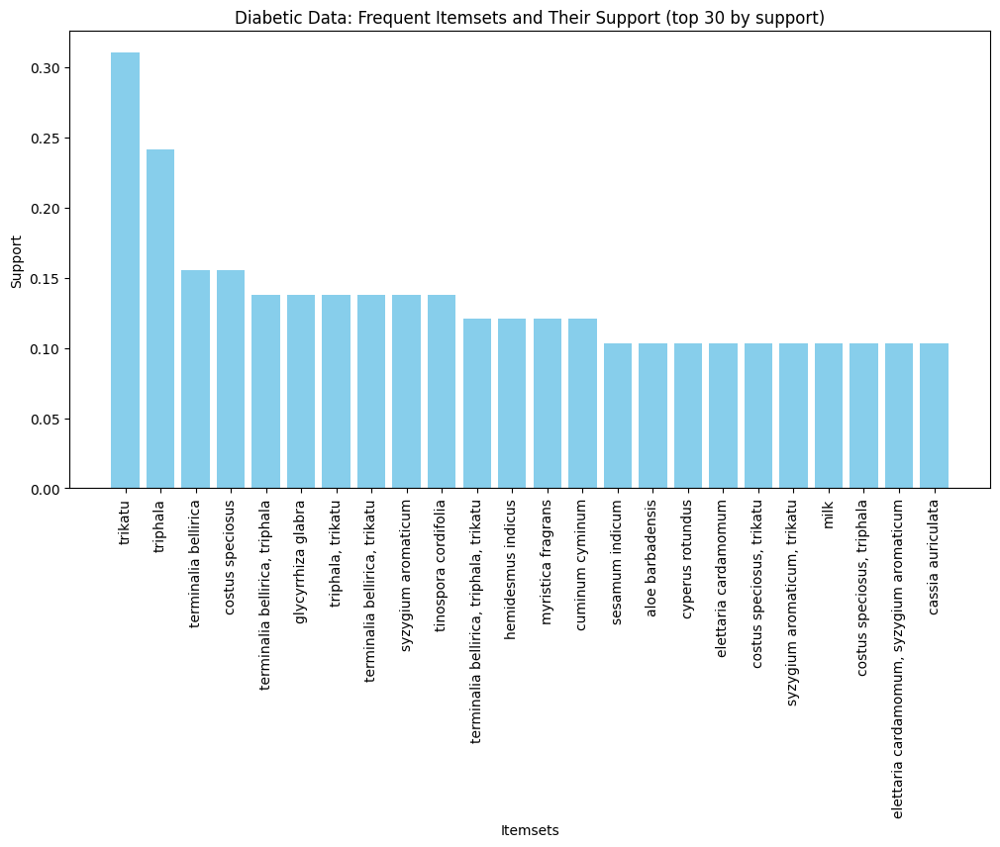

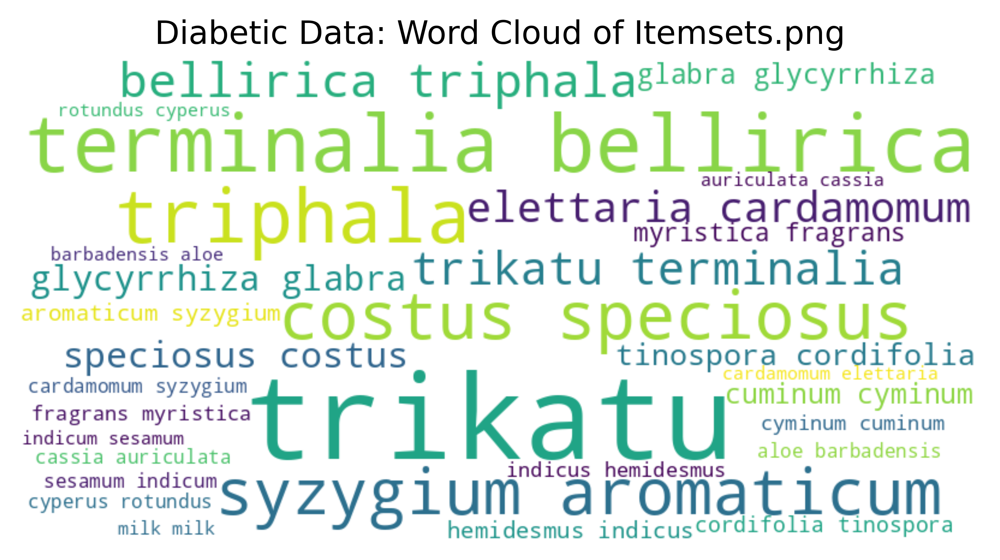

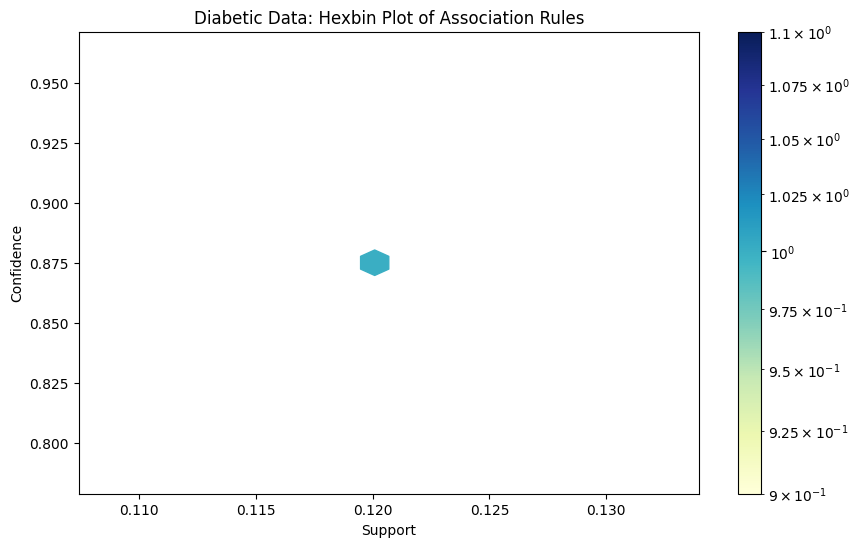

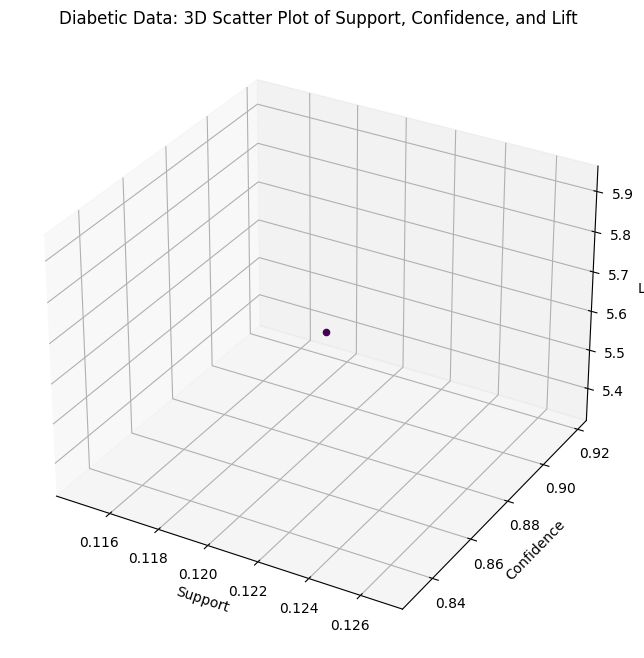

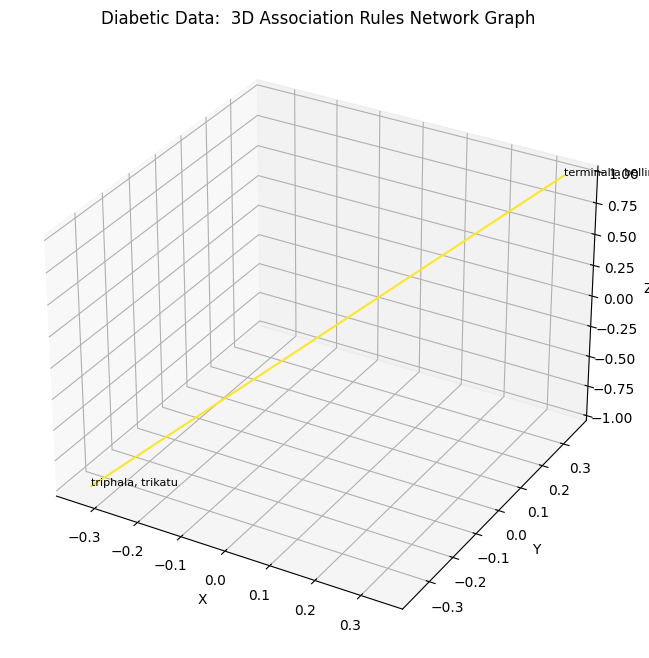

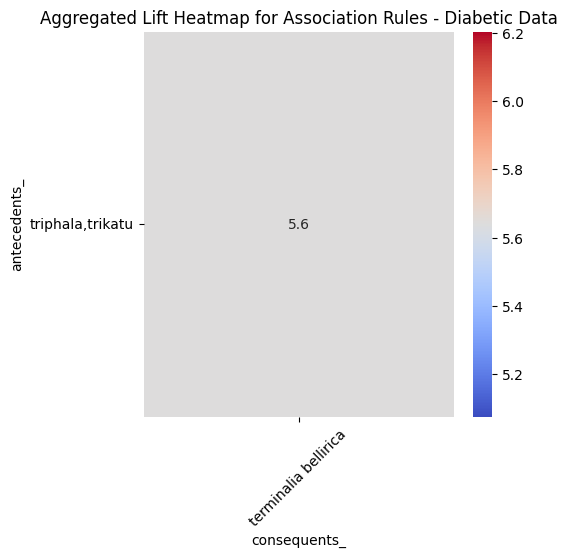

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: 

<Figure size 640x480 with 0 Axes>

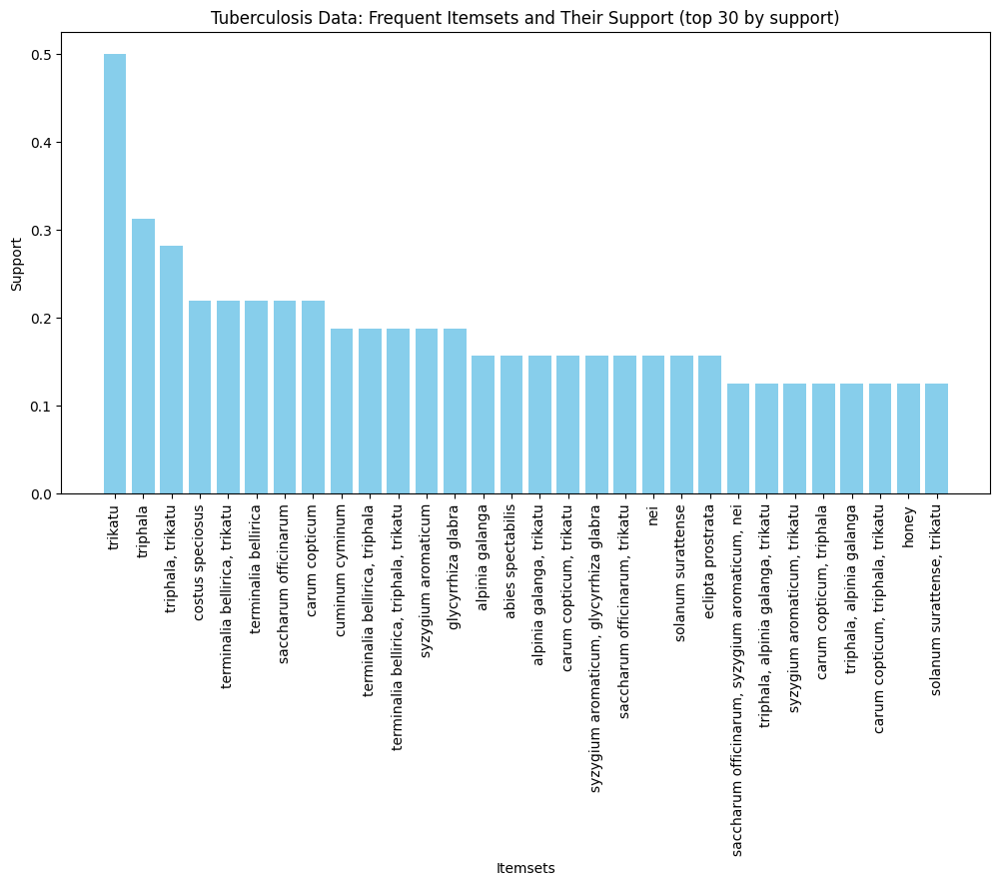

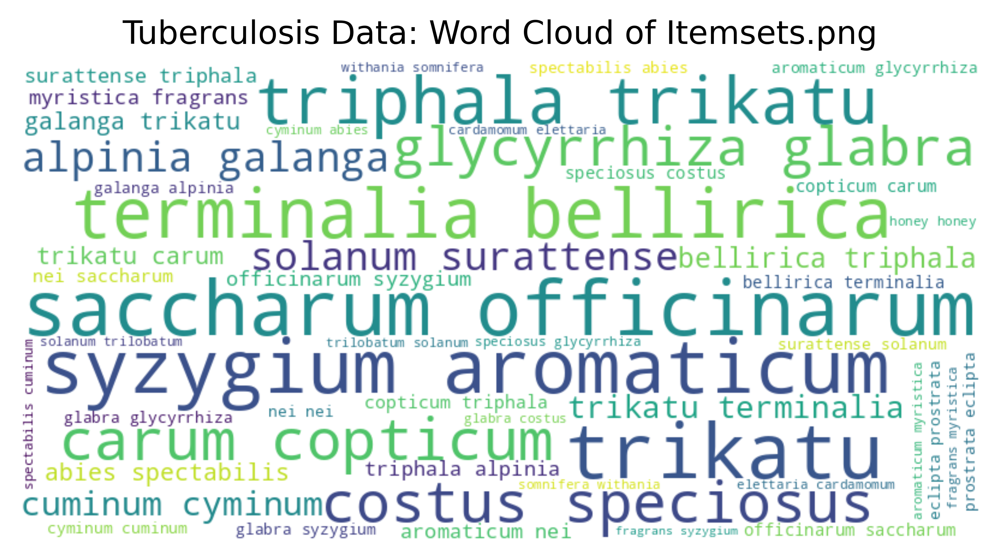

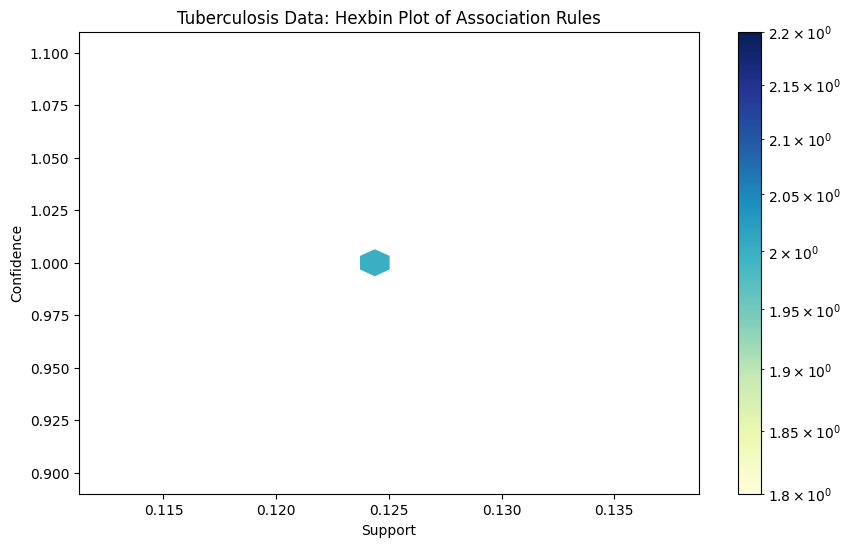

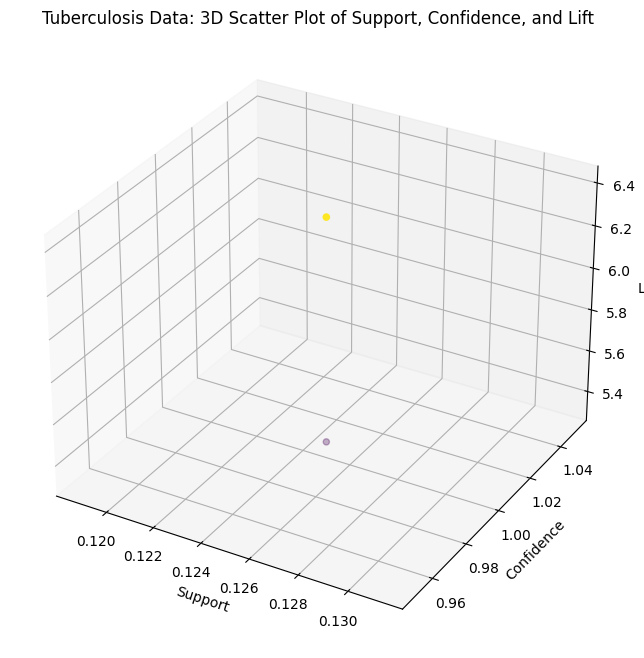

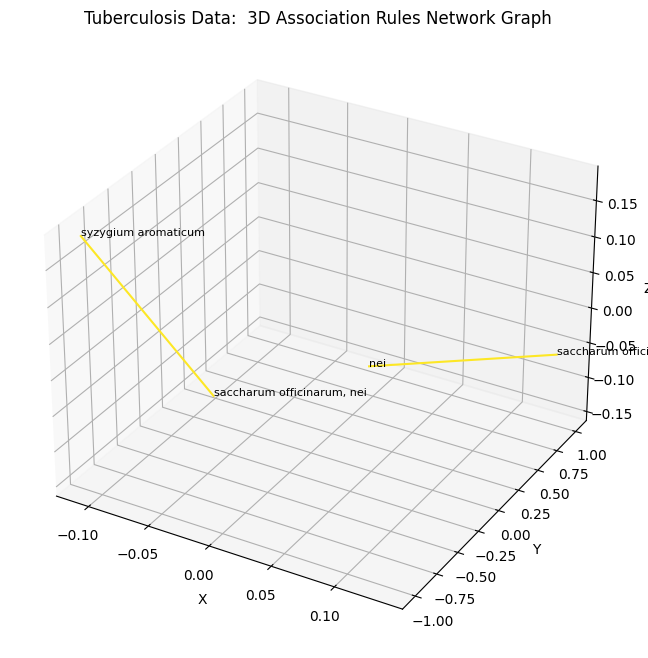

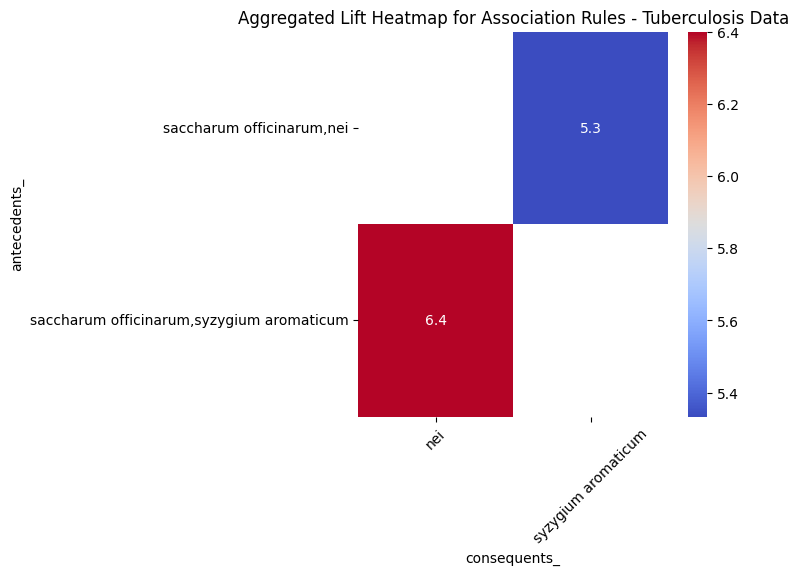

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: 

<Figure size 640x480 with 0 Axes>

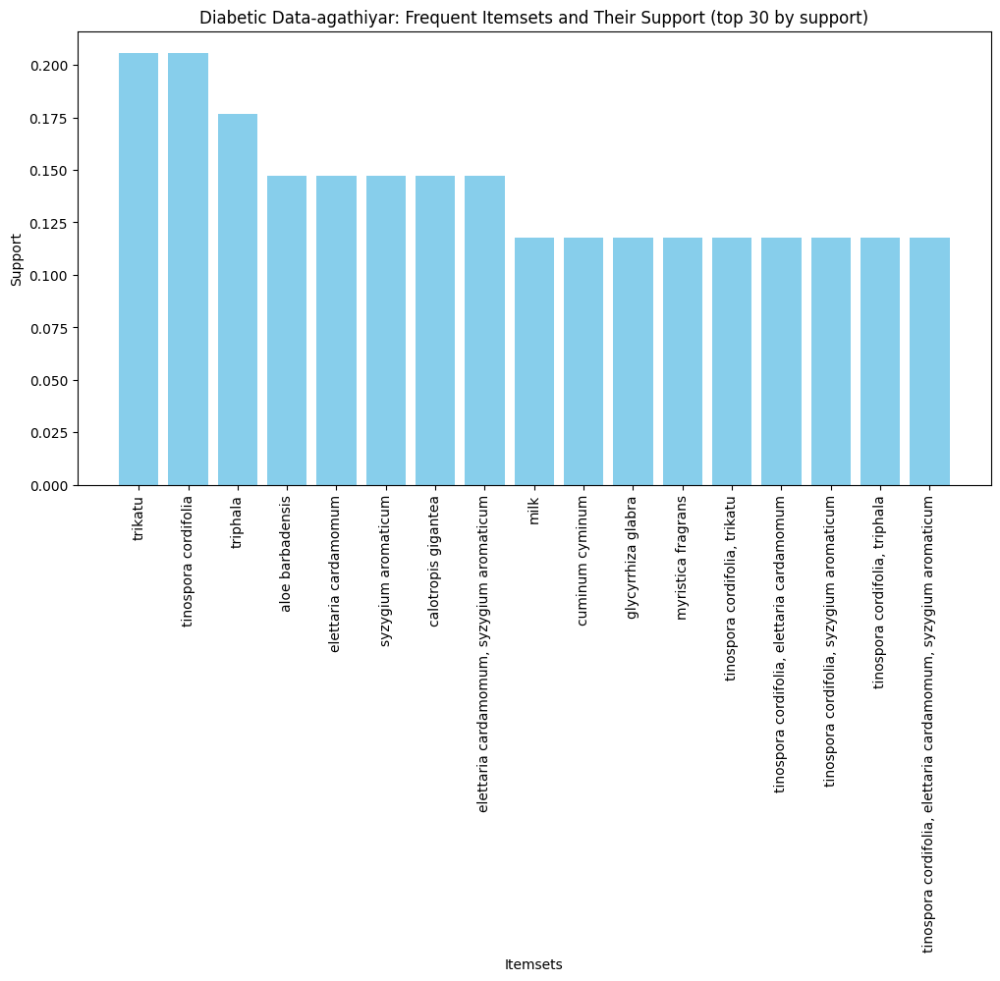

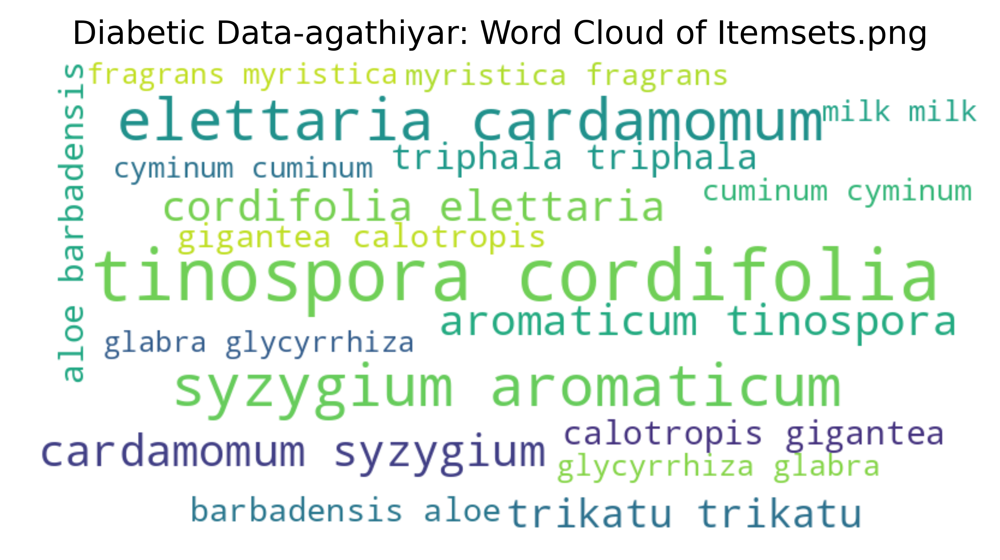

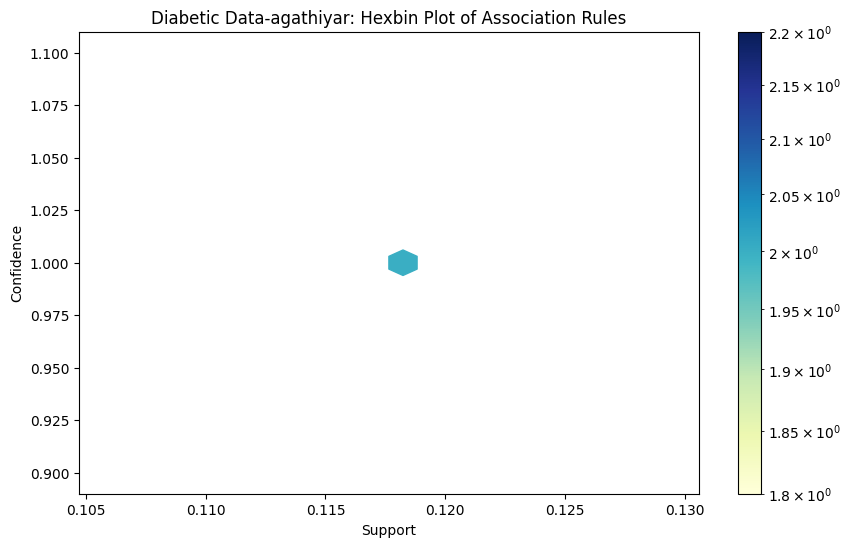

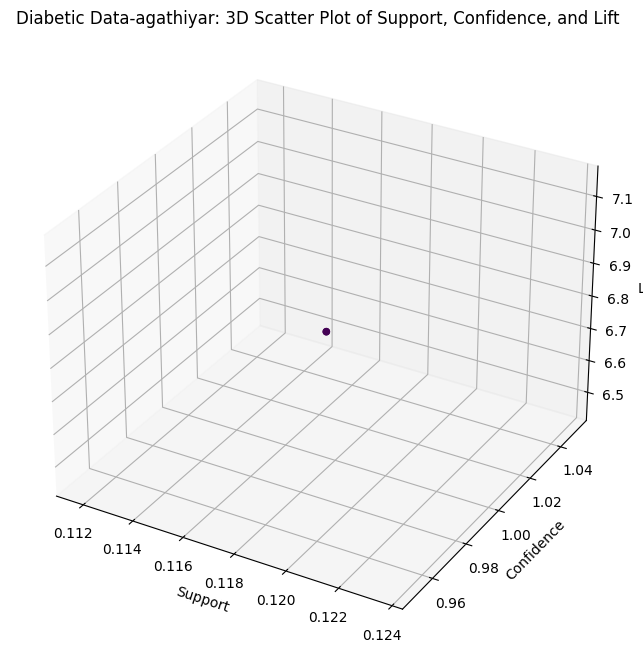

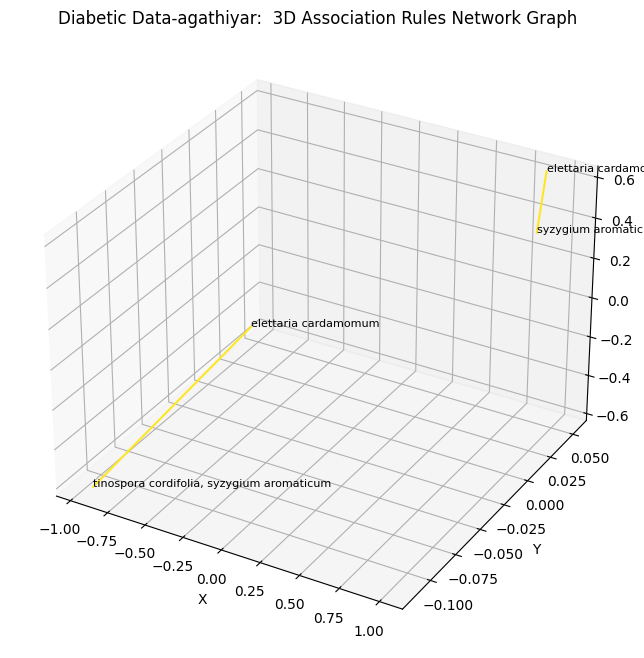

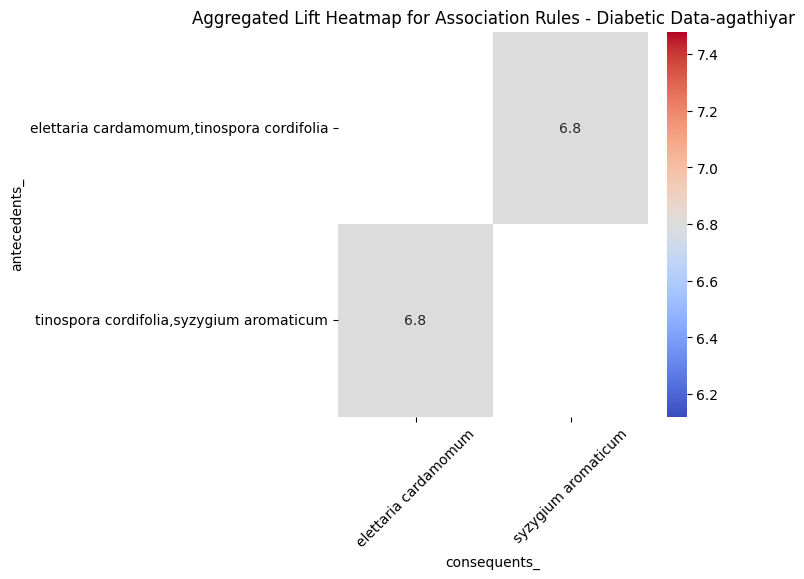

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: 

<Figure size 640x480 with 0 Axes>

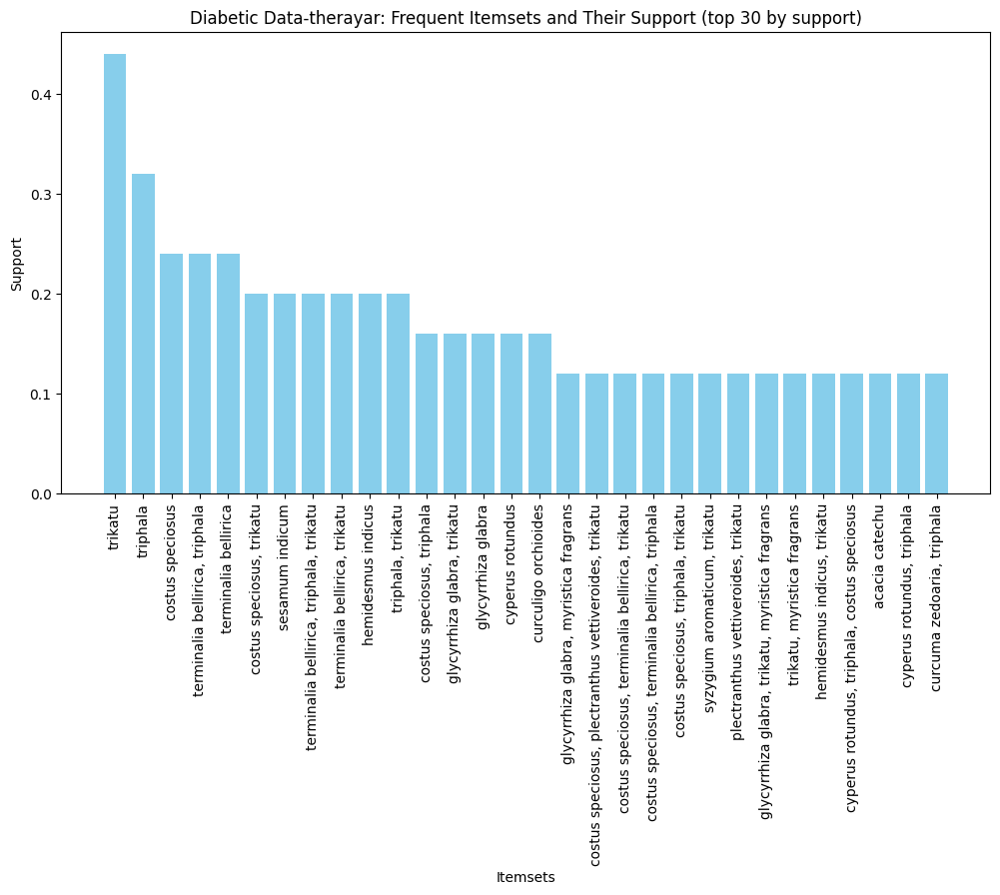

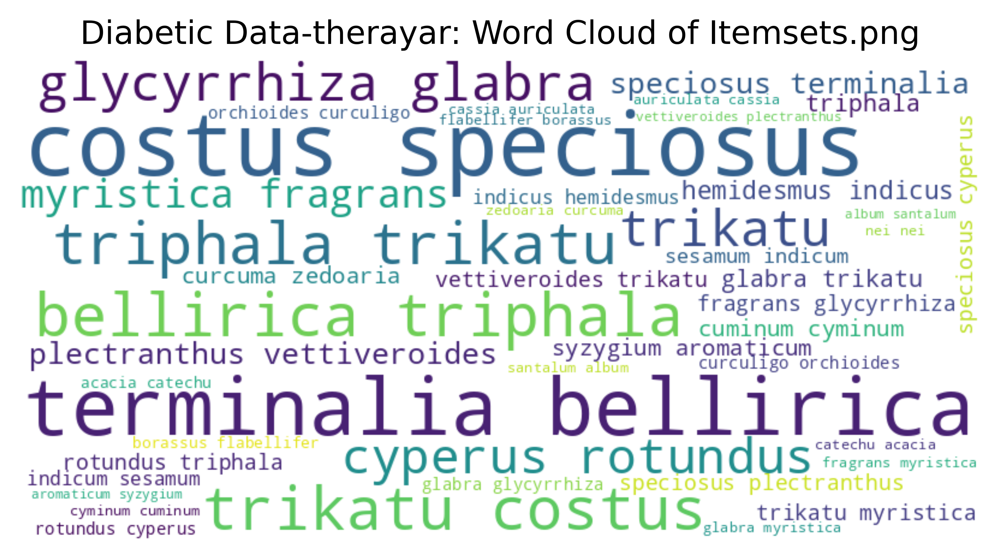

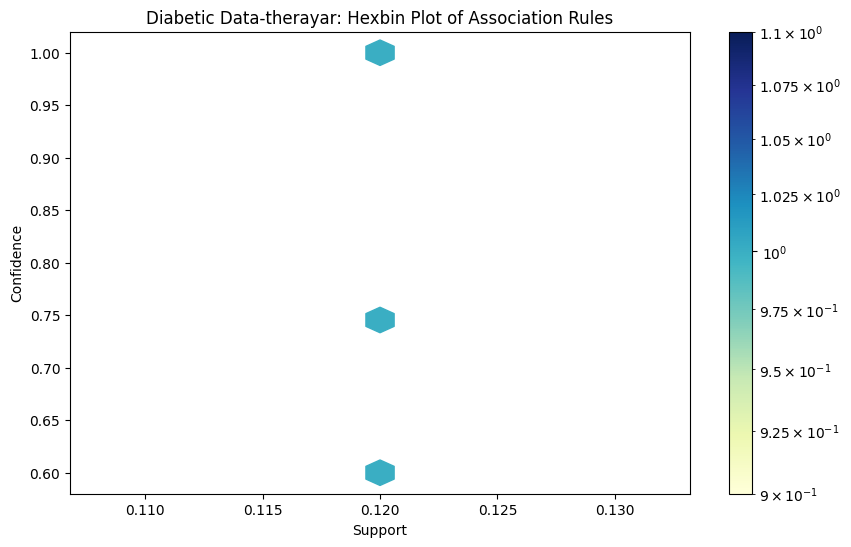

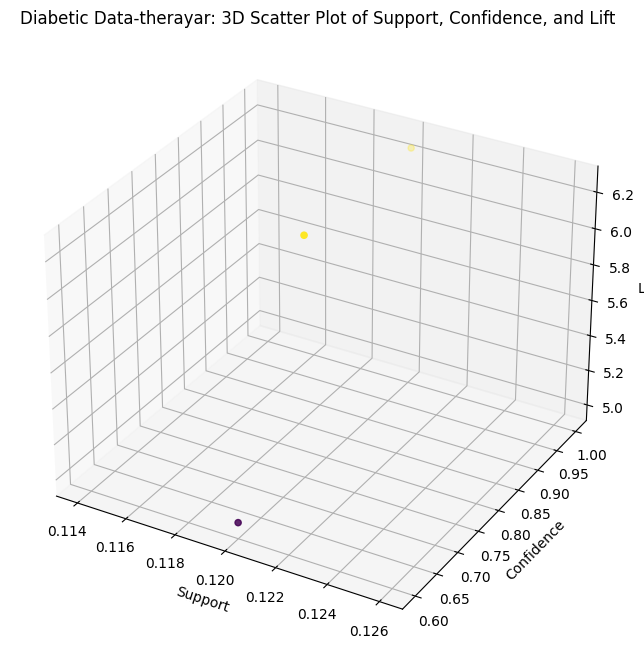

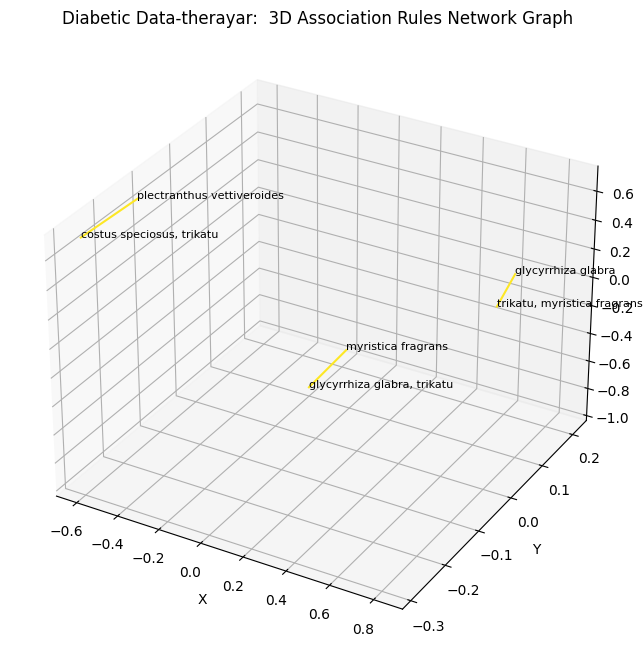

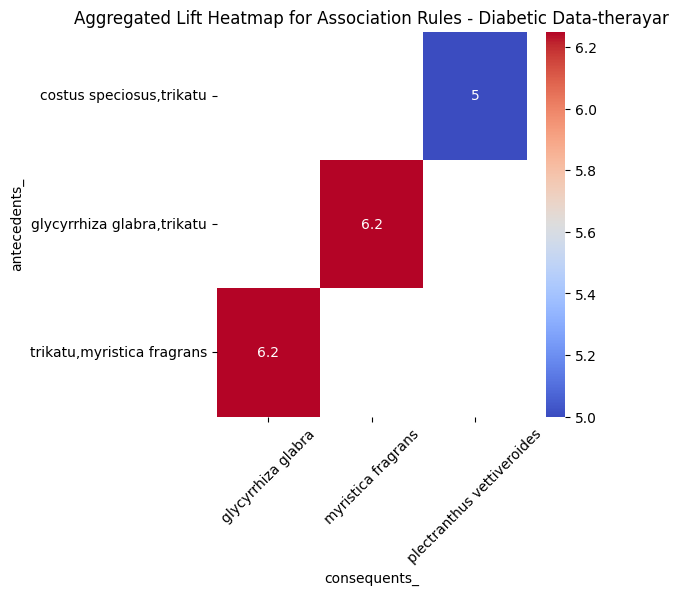

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: 

<Figure size 640x480 with 0 Axes>

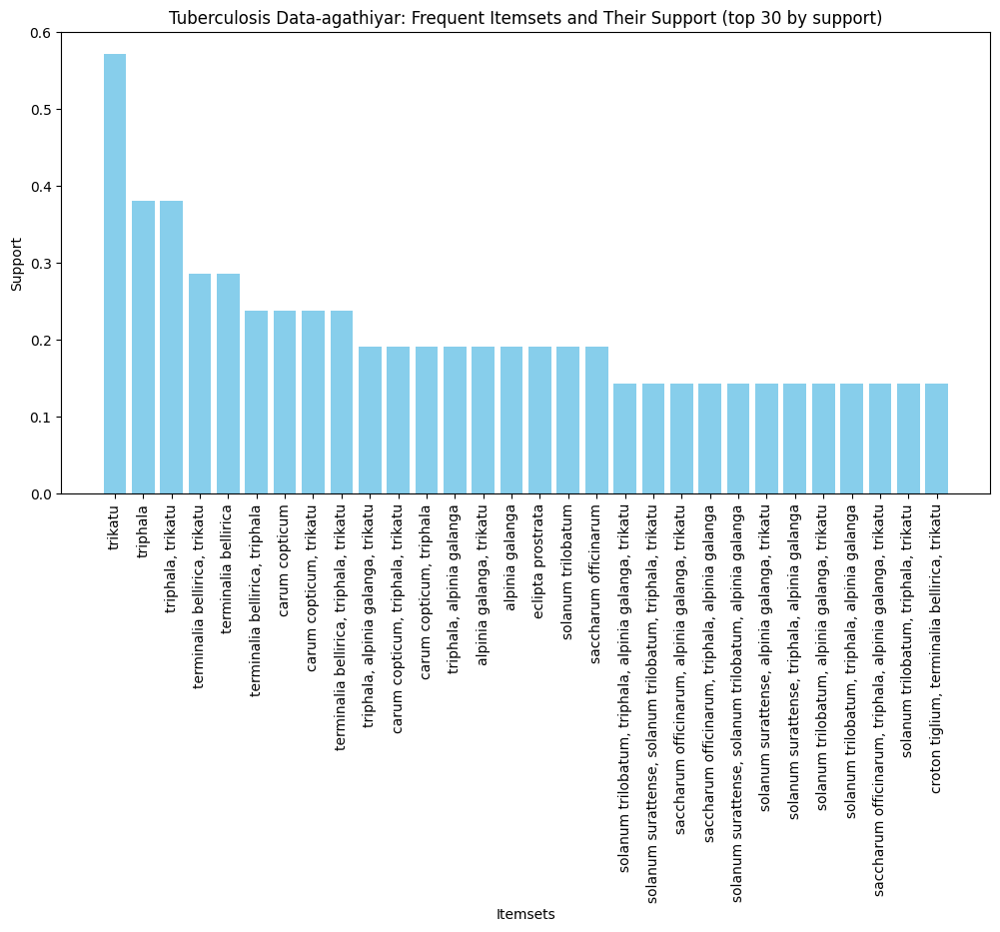

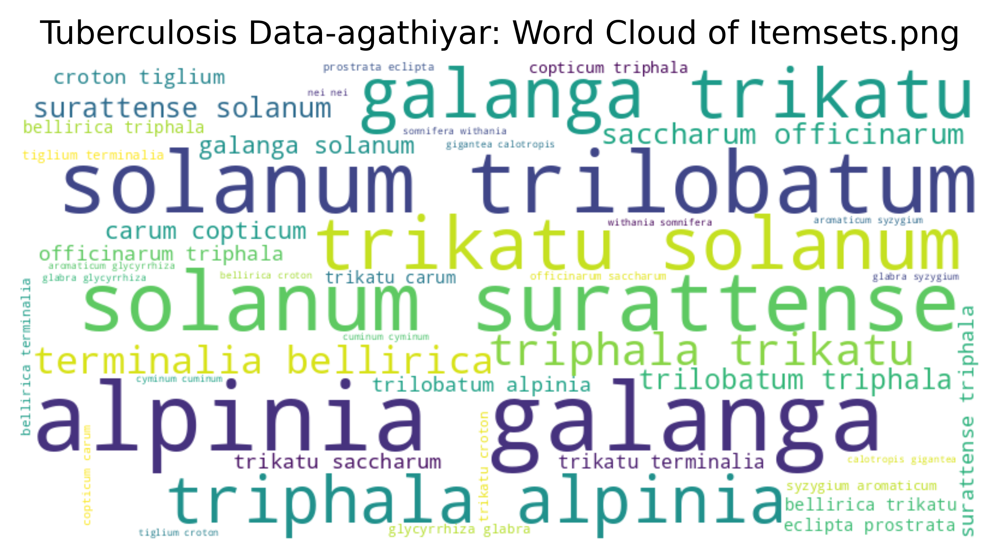

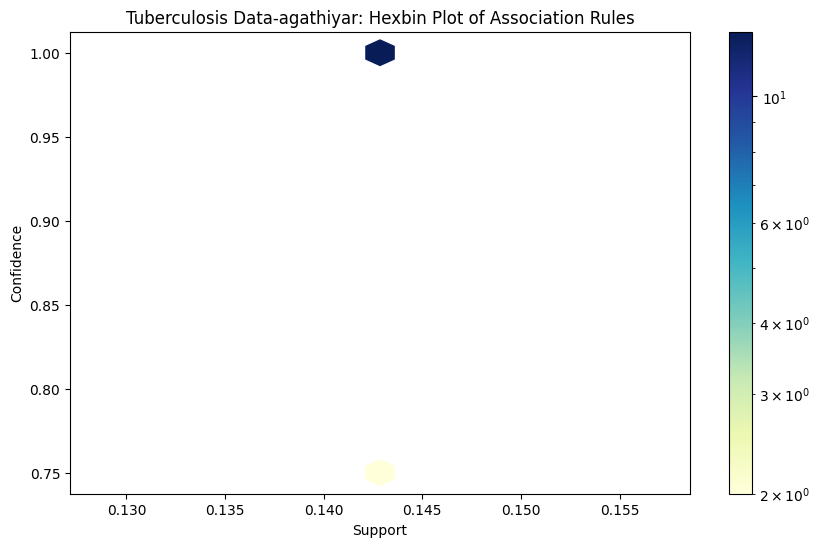

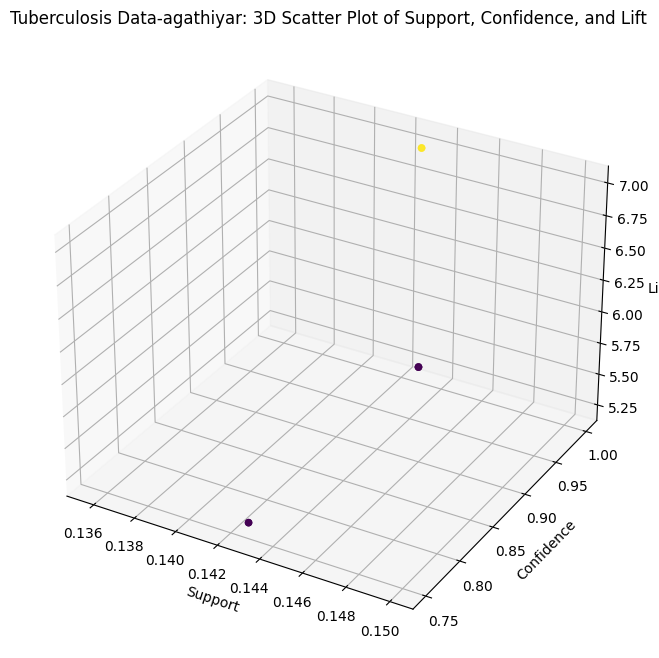

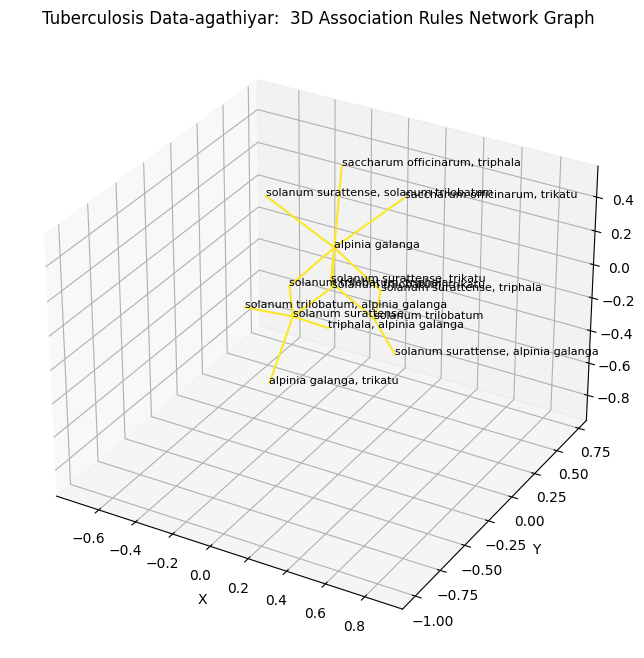

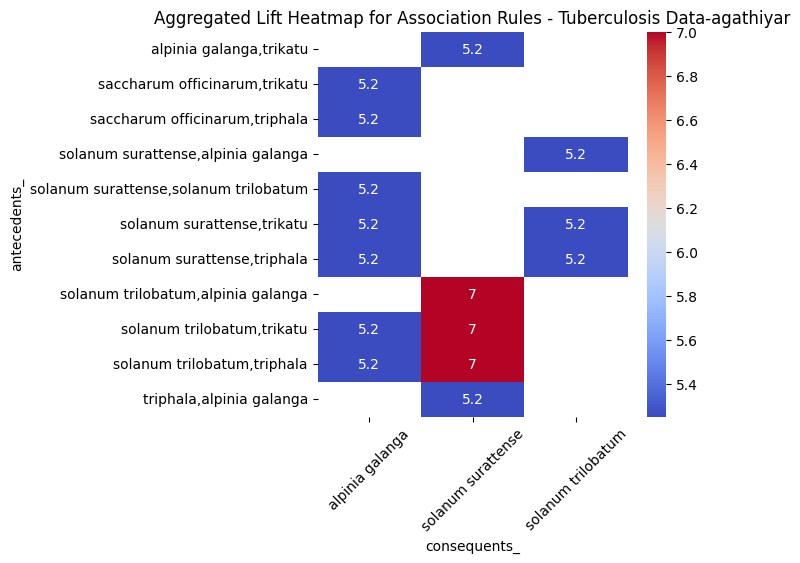

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: 

<Figure size 640x480 with 0 Axes>

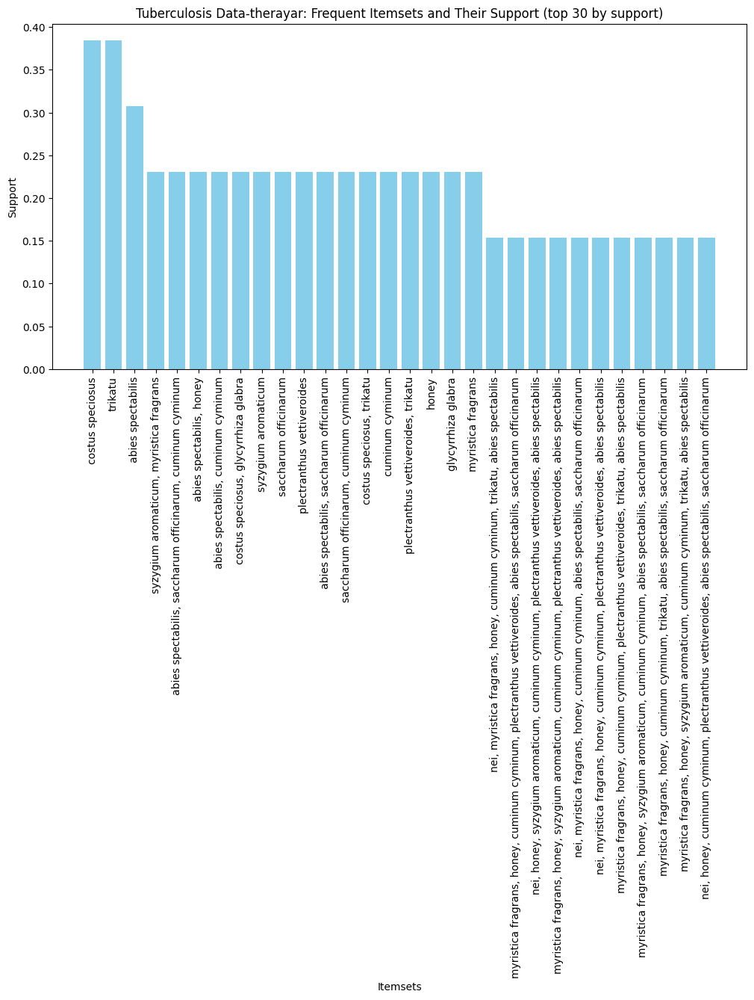

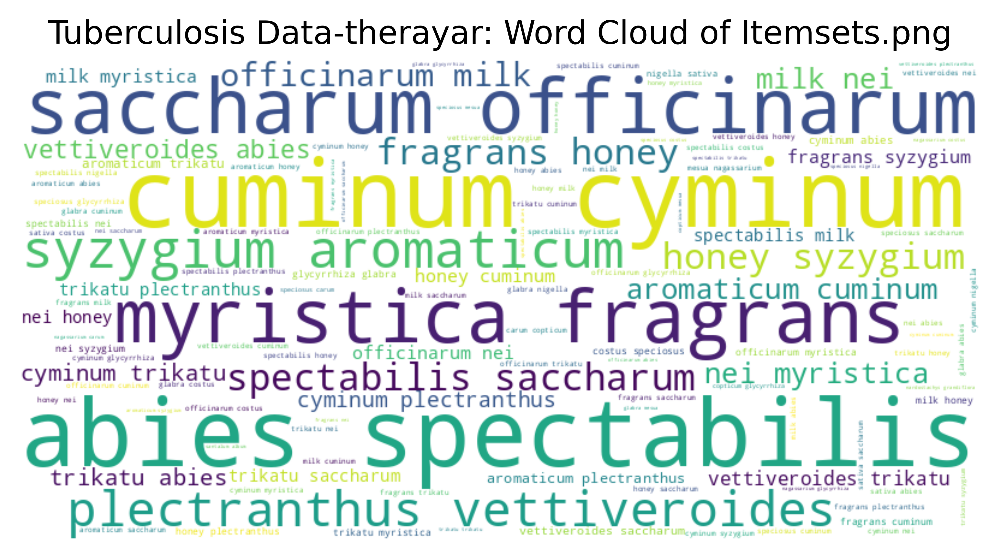

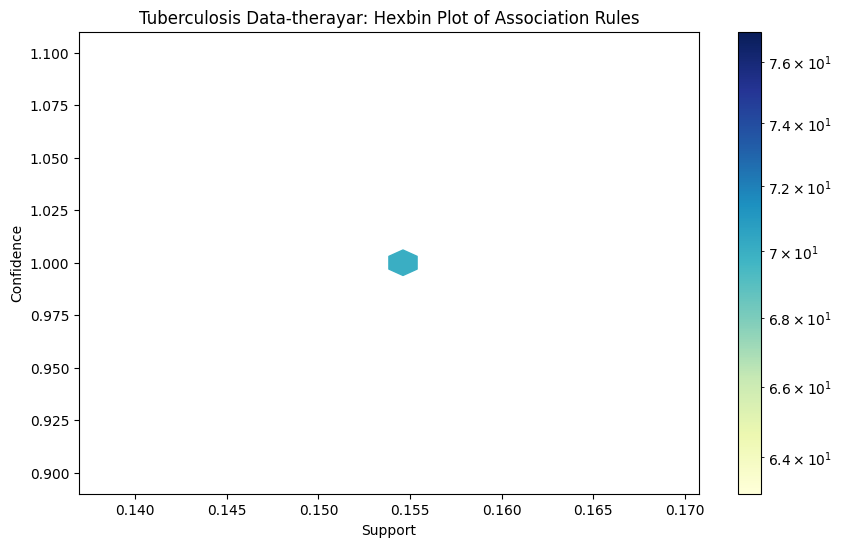

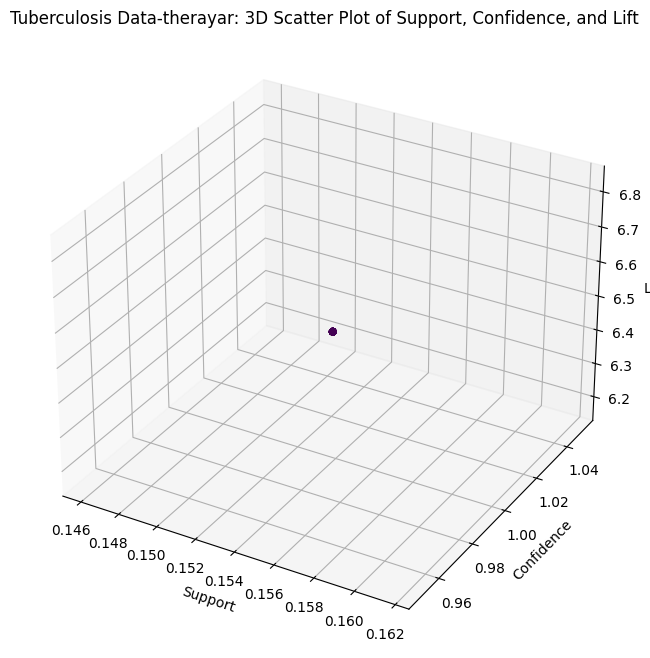

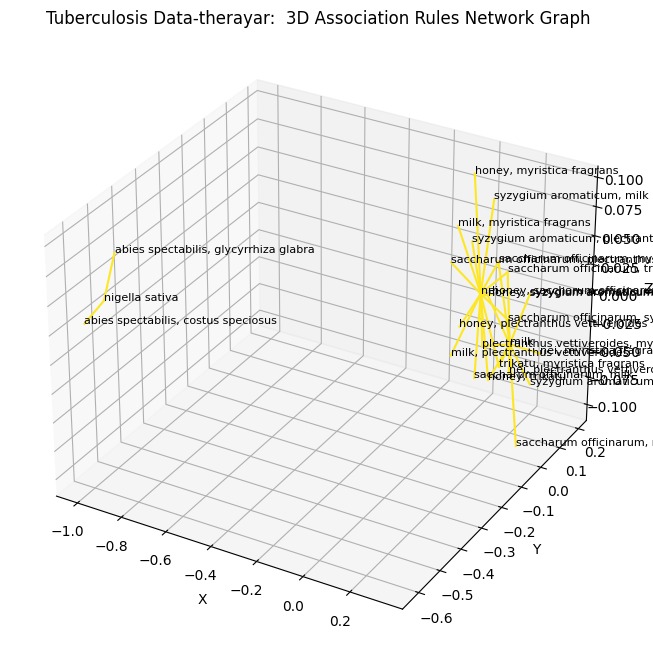

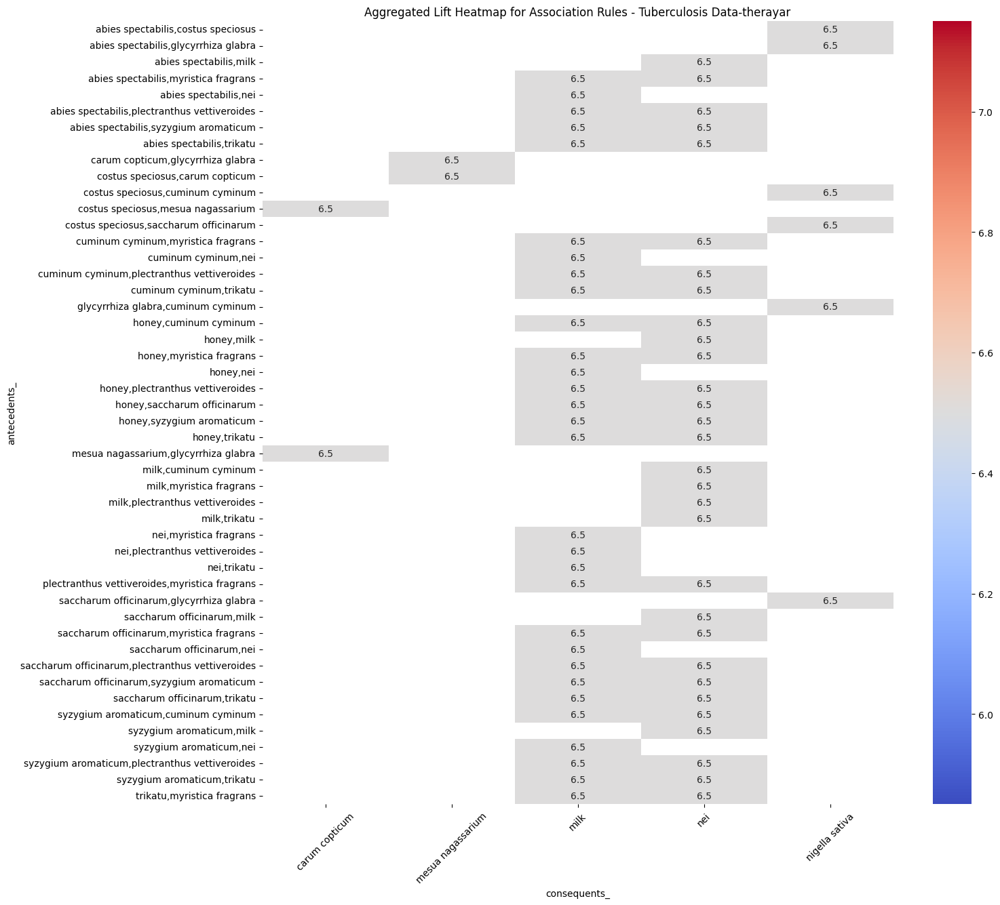

<Figure size 640x480 with 0 Axes>

In [58]:
plot_all(data_dia, "Diabetic Data")
plot_all(data_tub, "Tuberculosis Data")
plot_all(data_dia_aga, "Diabetic Data-agathiyar")
plot_all(data_dia_the, "Diabetic Data-therayar")
plot_all(data_tub_aga, "Tuberculosis Data-agathiyar")
plot_all(data_tub_the, "Tuberculosis Data-therayar")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [56]:
import seaborn as sns
def plot_heatmap(df, data_name):
    frequent_itemsets = apply_apriori(df)
    apriori_rules = get_association_filter(frequent_itemsets)
    apriori_rules['lhs_items'] = apriori_rules['antecedents'].apply(lambda x:len(x) )
    apriori_rules[apriori_rules['lhs_items']>1].sort_values('lift', ascending=False).head()
    apriori_rules['antecedents_'] = apriori_rules['antecedents'].apply(lambda a: ','.join(list(a)))
    apriori_rules['consequents_'] = apriori_rules['consequents'].apply(lambda a: ','.join(list(a)))
    pivot = apriori_rules[apriori_rules['lhs_items']>1].pivot(index = 'antecedents_', columns = 'consequents_', values= 'lift')
    if (len(apriori_rules)>50):
      plt.figure(figsize=(15,15))
    elif (len(apriori_rules)>20):
      plt.figure(figsize=(10,10))
    else:
      plt.figure(figsize=(5,5))

    sns.heatmap(pivot, annot=True, cmap='coolwarm')
    # sns.heatmap(pivot, annot = True)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45)
    plt.title(f'Aggregated Lift Heatmap for Association Rules - {data_name}')
    plt.show()
    plt.savefig(f'Aggregated Lift Heatmap for Association Rules - {data_name}.png', bbox_inches='tight')

# plot_heatmap(data_tub_aga, "Diabeties - Tuberculosis [2 -> 1]")
# plot_heatmap(data_dia_the, "Tuberculosis - Therayar")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [59]:
import time
from google.colab import files
import os

# Set the directory where your CSV files are located
directory = "/content/"

# List all files in the specified directory
fs = os.listdir(directory)
print(len(fs))
# Filter and download only the CSV files
for f in fs:
    if f.endswith(".png"):
        files.download(directory + f)

70


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>